<h1 style="font-size:30px;">Finetuning YOLOv8 for Instance Segmentation on Custom Dataset</h1>

In this notebook, we will finetune the latest YOLOv8m-seg model on NulnSeg Kaggle dataset.

<img src = "https://learnopencv.com/wp-content/uploads/2024/04/Notebook-Feature-Image-YOLOv9-for-Instance-Segmentation.png" width=1000 height=500>



NulnsSeg Kaggle dataset contains more than 30k manually segmented nuclei from 31 human and mouse organs and 665 image patches extracted from H&E-stained whole slide microscopic images.

The dataset contains tissues of various human and mouse organs.
Key human and mouse organs include the cerebellum, kidney, liver, pancreas, etc.

The dataset contains a single Nuclei class.

The dataset has `665` images in total so we will split it with an 80:20 train val split ratio.
So, the final split has `532` training and `133` validation images, respectively.


Dependencies

In [ ]:
!pip install -q ultralytics pycocotools scikit-learn matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.4/887.4 kB 23.0 MB/s eta 0:00:00


Imports

In [ ]:
import os
import copy
import random
import json
import yaml
import glob
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import requests
from   zipfile import ZipFile
import argparse
from PIL import Image
import PIL.Image
import shutil
from IPython.display import Image
from sklearn.model_selection import train_test_split

import torch
import torch.utils.data
from torch import nn
import torchvision
from ultralytics import YOLO

from torchvision import transforms as T


from pycocotools import mask as coco_mask
from pycocotools.coco import COCO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


##Data preparation

In [ ]:
def set_seeds():
    # fix random seeds
    SEED_VALUE = 42

    random.seed(SEED_VALUE)
    np.random.seed(SEED_VALUE)
    torch.manual_seed(SEED_VALUE)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(SEED_VALUE)
        torch.cuda.manual_seed_all(SEED_VALUE)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = True


set_seeds()

This function block is used to **download and unzip** the dataset in the specified directory.

In [ ]:
def download_and_unzip(url, save_path, extract_dir):
    print("Downloading assets...")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)
    print("Download completed.")

    try:
        if save_path.endswith(".zip"):
            with ZipFile(save_path, 'r') as zip_ref:
                zip_ref.extractall(extract_dir)
            print("Extraction Done")
    except Exception as e:
        print(f"An error occurred: {e}")

DATASET_URL = r"https://www.dropbox.com/scl/fi/u83yuoea9hu7xhhhsgp4d/Nuclei_Instance_Seg.zip?rlkey=7tw3vs4xh7rych4yq1xizd8mh&dl=1"
DATASET_DIR = "Nuclei-Instance-Dataset"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# Download and extract if dataset does not exist.
if not os.path.exists(DATASET_DIR):
    os.makedirs(DATASET_DIR, exist_ok=True)  # Ensure the directory exists
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH, DATASET_DIR)
    os.remove(DATASET_ZIP_PATH)  # Remove the zip file after extraction


Download completed.
Extraction Done


The dataset comes with many subdirectories. However, for our `YOLOv8m-seg` fine-tuning, we just need the raw images and labeled masks, which we will convert to the appropriate format.

For our task, we will keep the directories with subdirectories named `‘tissue images’` , `‘mask binary without border’`, and `‘label masks modify’`.


In [ ]:
def prune_subdirectories(base_dir,keep_dirs):
    #Iterate through each subdirs in base dir
    for root_dir in os.listdir(base_dir):
        root_path = os.path.join(base_dir,root_dir)
        if os.path.isdir(root_path):
          #  print(f"Processing: {root_path}")
           #List all subdirs inside the current root dir
           for sub_dir in os.listdir(root_path):
               sub_path = os.path.join(root_path, sub_dir)
               #If the subdirectory isn't in the keep list, delete it
               if os.path.isdir(sub_path) and sub_dir not in keep_dirs:
                  # print(f"Deleting: {sub_path}")
                  shutil.rmtree(sub_path)
               elif os.path.isdir(sub_path):
                  # print(f"Keeping: {sub_path}")
                  pass


base_directory = "./Nuclei-Instance-Dataset"
directories_to_keep = ['tissue images', 'mask binary witthout border', 'label masks modify']

prune_subdirectories(base_directory,directories_to_keep)



In [ ]:

!sudo apt install tree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 49 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 0s (141 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tree.
(Reading database ... 123629 files and directories currently install

After pruning, our dataset tree will look like this:

In [ ]:
!tree --dirsfirst -L 2  "Nuclei-Instance-Dataset"

Nuclei-Instance-Dataset
├── human bladder
│   ├── label masks modify
│   └── tissue images
├── human brain
│   ├── label masks modify
│   └── tissue images
├── human cardia
│   ├── label masks modify
│   └── tissue images
├── human cerebellum
│   ├── label masks modify
│   └── tissue images
├── human epiglottis
│   ├── label masks modify
│   └── tissue images
├── human jejunum
│   ├── label masks modify
│   └── tissue images
├── human kidney
│   ├── label masks modify
│   └── tissue images
├── human liver
│   ├── label masks modify
│   └── tissue images
├── human lung
│   ├── label masks modify
│   └── tissue images
├── human melanoma
│   ├── label masks modify
│   └── tissue images
├── human muscle
│   ├── label masks modify
│   └── tissue images
├── human oesophagus
│   ├── label masks modify
│   └── tissue images
├── human pancreas
│   ├── label masks modify
│   ├── tissue images
│   └── Thumbs.db
├── human peritoneum
│   ├── label masks modify
│   └── tissue images
├── human placen

## Convert Label Masks to Yolo Annotations

Next, let’s try to convert our annotations from binary masks to YOLO format. As an intermediate step, let’s convert them to COCO JSON format, which is easy to interpret.

The `get_image_mask_pairs( )` returns all image and mask paths from the dataset appended to a list.


Binary masks are a common way to represent object annotations in segmentation tasks. They efficiently encode the shape of objects at the pixel level. However, for tasks like visualization or calculating object properties, we need to convert these masks into polygons.
`mask_to_polygons( )` shows one such approach to extract polygons from a binary mask.

In [ ]:

def get_image_mask_pairs(data_dir):
    image_paths = []
    mask_paths = []

    for root,_,files in os.walk(data_dir):
        if 'tissue images' in root:
            for file in files:
                if file.endswith('.png'):
                    image_paths.append(os.path.join(root,file))
                    mask_paths.append(os.path.join(root.replace('tissue images','label masks modify'), file.replace('.png','.tif')))
    return image_paths, mask_paths


We need to convert our tissue’s binary mask to actionable polygon points. For this, let’s use `cv2.findContours` to extract approximate polygons of the binary mask. This ensures we get a valid closed polygon with more than 4 sides and outlines around mask borders.
By using `cv2.RETR_TREE` as contour retrieval mode, we can reconstruct a hierarchical relationship between all the detected contours.

In [ ]:
def mask_to_polygons(mask,epsilon=1.0):
    contours,_ = cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    polygons = []
    for contour in contours:
        if len(contour) > 2:
           poly = contour.reshape(-1).tolist()
           if len(poly) > 4: #Ensures valid polygon
              polygons.append(poly)
    return polygons

## Dataset Preparation

In `process_data( )`, we will initialize annotation and images as empty lists to which we will append all the metadata. Additionally, image ID and ann ID will have zero as initial values.

We will simultaneously iterate through the image_paths and mask_path list we got from the  `get_image_mask_pairs` utility function. For each image, we assign a unique `image_id` by incrementing with 1 after each iteration. Then, we will read our image and mask using opencv. The `cv2.IMREAD_UNCHANGED` helps to read masks, including an alpha channel if present.

For each value representing an object(ignoring background), we construct a binary mask where pixels corresponding to the current unique value are set to 255(white) to highlight the object instance.

While all other pixels are set to 0(black) effectively isolating the object from the background. The binary mask is then passed as input to the `mask_to_polygons( )` function, which processes the mask and returns a series of polygons.


In [ ]:
def process_data(image_paths, mask_paths, output_images_dir, output_labels_dir):
    annotations = []
    images = []
    image_id = 0
    ann_id = 0

    for img_path, mask_path in zip(image_paths, mask_paths):
        image_id += 1
        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
        shutil.copy(img_path, os.path.join(output_images_dir, os.path.basename(img_path)))

        # Add image to the list
        images.append({
            "id": image_id,
            "file_name": os.path.basename(img_path),
            "height": img.shape[0],
            "width": img.shape[1]
        })

        unique_values = np.unique(mask)
        for value in unique_values:
            if value == 0:  # Ignore background
                continue

            object_mask = (mask == value).astype(np.uint8) * 255
            polygons = mask_to_polygons(object_mask)

            for poly in polygons:
                ann_id += 1
                annotations.append({

                    "image_id": image_id,
                    "category_id": 1,  # Only one category: Nuclei
                    "segmentation": [poly],

                })

    coco_input = {
        "images": images,
        "annotations": annotations,
        "categories": [{"id": 1, "name": "Nuclei"}]
    }

    # Convert COCO-like dictionary to YOLO format
    for img_info in coco_input["images"]:
        img_id = img_info["id"]
        img_ann = [ann for ann in coco_input["annotations"] if ann["image_id"] == img_id]
        img_w, img_h = img_info["width"], img_info["height"]

        if img_ann:
            with open(os.path.join(output_labels_dir, os.path.splitext(img_info["file_name"])[0] + '.txt'), 'w') as file_object:
                for ann in img_ann:
                    current_category = ann['category_id'] - 1
                    polygon = ann['segmentation'][0]
                    normalized_polygon = [format(coord / img_w if i % 2 == 0 else coord / img_h, '.6f') for i, coord in enumerate(polygon)]
                    file_object.write(f"{current_category} " + " ".join(normalized_polygon) + "\n")



Now, for each image, a corresponding .txt annotation file is created, and we extract the ‘category_id’ and ‘polygon’ of the current object instance in a recurring loop. The polygon is then normalized relative to the current image dimensions. Thus, a set of .txt files for all images is created in the output labels dir, which will be utilized during fine-tuning.

In [ ]:
def create_yaml(output_yaml_path, train_images_dir, val_images_dir, nc=1):
    # Assuming all categories are the same and there is only one class, 'Nuclei'
    names = ['Nuclei']

    # Create a dictionary with the required content
    yaml_data = {
        'names': names,
        'nc': nc,  # Number of classes
        'train': train_images_dir,
        'val': val_images_dir,
        'test': ' '

    }

    # Write the dictionary to a YAML file
    with open(output_yaml_path, 'w') as file:
        yaml.dump(yaml_data, file, default_flow_style=False)


Now, the `yolo_dataset_preparation( )` function defines all the paths and calls the required set of utility functions. To simply put, this function is responsible for extracting the polygons from the raw binary masks and converting them into YOLO format. Finally, it creates `data.yaml` file for our finetuning.

We create a new proyect named `yolov8_m_dataset_10` with 3 diferents data folders:

* The labeled folder, that contains 10% of the original data
* The unlabeled folder, that contains the 70% of yhe original data, and will simulate the unlabeled data that we have in real word applications.
* The validation folder, that contains the 305 of total data.

On the `train_test_split()`, we set `random_state=42` to ensure the replicability of the experiment.

In [ ]:
def yolo_dataset_preparation():
    data_dir = 'Nuclei-Instance-Dataset'
    output_dir = 'yolov8_m_dataset_10'

    # Define the paths for the images and labels for training and validation
    labeled_images_dir = os.path.join(output_dir, 'labeled', 'images')
    unlabeled_images_dir = os.path.join(output_dir, 'unlabeled', 'images')
    val_images_dir = os.path.join(output_dir, 'val', 'images')
    labeled_labels_dir = os.path.join(output_dir, 'labeled', 'labels')
    unlabeled_labels_dir = os.path.join(output_dir, 'unlabeled', 'labels')
    val_labels_dir = os.path.join(output_dir, 'val', 'labels')

    # Create the output directories if they do not exist
    os.makedirs(labeled_images_dir, exist_ok=True)
    os.makedirs(unlabeled_images_dir, exist_ok=True)
    os.makedirs(val_images_dir, exist_ok=True)
    os.makedirs(labeled_labels_dir, exist_ok=True)
    os.makedirs(unlabeled_labels_dir, exist_ok=True)
    os.makedirs(val_labels_dir, exist_ok=True)

    # Get image and mask paths
    image_paths, mask_paths = get_image_mask_pairs(data_dir)

    # Split data into train and val
    train_img_paths, val_img_paths, train_mask_paths, val_mask_paths = train_test_split(image_paths, mask_paths, test_size=0.2, random_state=42)
    # Split train data into labeled and unlabeled, 10% of the data used for training
    labeled_img_paths, unlabeled_img_paths, labeled_mask_paths, unlabeled_mask_paths = train_test_split(train_img_paths, train_mask_paths, test_size=0.87, random_state=42)
    # Process and save the data in YOLO format for training and validation
    process_data(labeled_img_paths, labeled_mask_paths, labeled_images_dir, labeled_labels_dir) #labeled data
    process_data(unlabeled_img_paths, unlabeled_mask_paths, unlabeled_images_dir, unlabeled_labels_dir) #unlabeled data
    process_data(val_img_paths, val_mask_paths, val_images_dir, val_labels_dir) #Original validation data its used

    # Assume create_yaml function is defined elsewhere and set appropriate paths for the YAML file
    output_yaml_path = os.path.join(output_dir, 'data.yaml')
    train_path = os.path.join('labeled', 'images')
    val_path = os.path.join('val', 'images')
    create_yaml(output_yaml_path, train_path, val_path)

yolo_dataset_preparation()

## Model Configuration

In [ ]:
#Instance
model = YOLO("yolov8m-seg.yaml")#build a model from YAML
model = YOLO("yolov8m-seg.pt") #Transfer the weights from a pretrained model (recommended for training)

100%|██████████| 52.4M/52.4M [00:00<00:00, 90.8MB/s]


**Restart session if dill package gets updated**

In [ ]:
%cat yolov8_m_dataset_10/data.yaml

names:
- Nuclei
nc: 1
test: ' '
train: labeled/images
val: val/images


In [ ]:
with open("yolov8_m_dataset_10/data.yaml",'r') as stream:
     num_classes = str(yaml.safe_load(stream)['nc'])

## Train the Model

In [ ]:
#Define a project --> Destination directory for all results
project = "yolov8_m_dataset_10/results"
#Define subdirectory for this specific training
name = "70_epochs-"

In [ ]:
ABS_PATH = os.getcwd()


We will train our models for 70 epochs and save our training logs into the specified project directory.


In [ ]:
#Train the model
results = model.train(
    data = os.path.join(ABS_PATH, "yolov8_m_dataset_10/data.yaml"),
    project = project,
    name = name,
    epochs = 70,
    patience = 0 , #setting patience=0 to disable early stopping,
    batch = 4,
    seed = 42
)

Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=/content/yolov8_m_dataset_10/data.yaml, epochs=70, time=None, patience=0, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov8_m_dataset_10/results, name=70_epochs-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, s

100%|██████████| 755k/755k [00:00<00:00, 34.8MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 175MB/s]


AMP: checks passed ✅


train: Scanning /content/yolov8_m_dataset_10/labeled/labels... 69 images, 0 backgrounds, 0 corrupt: 100%|██████████| 69/69 [00:00<00:00, 197.55it/s]

train: New cache created: /content/yolov8_m_dataset_10/labeled/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/yolov8_m_dataset_10/val/labels... 133 images, 0 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<00:00, 157.19it/s]


val: New cache created: /content/yolov8_m_dataset_10/val/labels.cache
Plotting labels to yolov8_m_dataset_10/results/70_epochs-/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 86 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolov8_m_dataset_10/results/70_epochs-
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/70      1.37G      2.158      3.366      2.868       1.57         42        640: 100%|██████████| 18/18 [00:22<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.01it/s]

                   all        133       5575      0.678      0.576      0.608      0.289      0.671      0.568      0.597      0.271



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/70      5.09G      1.905      2.892      1.479      1.389         54        640: 100%|██████████| 18/18 [00:05<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.21it/s]

                   all        133       5575      0.821      0.463      0.598      0.271      0.807      0.455       0.56      0.221



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/70      5.13G      1.802       2.83      1.769      1.448         19        640: 100%|██████████| 18/18 [00:05<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.41it/s]

                   all        133       5575      0.553      0.554      0.524      0.257      0.535      0.524      0.488      0.198



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/70      6.06G      1.863      3.021        1.4      1.475         65        640: 100%|██████████| 18/18 [00:05<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.34it/s]

                   all        133       5575      0.442      0.585      0.452      0.205      0.418      0.547      0.404      0.132



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/70       5.6G       1.89      3.231      1.324      1.415        129        640: 100%|██████████| 18/18 [00:05<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.33it/s]


                   all        133       5575      0.152      0.317      0.088     0.0351     0.0911      0.186     0.0405     0.0113

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/70       4.1G      1.965      3.108      1.467      1.451         43        640: 100%|██████████| 18/18 [00:05<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.92it/s]

                   all        133       5575     0.0656      0.265     0.0404     0.0184     0.0558      0.222     0.0295     0.0118



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/70      4.71G      1.922      3.202      1.412      1.493         51        640: 100%|██████████| 18/18 [00:05<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.43it/s]

                   all        133       5575      0.203      0.561      0.162     0.0745      0.193      0.528      0.147     0.0545



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/70       4.5G      1.804      3.367      1.276       1.38        218        640: 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.37it/s]

                   all        133       5575      0.289      0.625       0.25      0.123      0.243       0.48      0.172     0.0723



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/70      5.07G      1.817      3.109      1.308      1.443         97        640: 100%|██████████| 18/18 [00:05<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.25it/s]

                   all        133       5575      0.647      0.579      0.613      0.287      0.655       0.55      0.579      0.239



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/70      4.93G      1.859      2.963      1.275      1.434         38        640: 100%|██████████| 18/18 [00:05<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.14it/s]


                   all        133       5575     0.0802      0.443     0.0557     0.0278     0.0767      0.424     0.0523     0.0225

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/70      6.41G      1.805      2.949      1.354      1.416         44        640: 100%|██████████| 18/18 [00:05<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  3.98it/s]


                   all        133       5575     0.0965      0.513     0.0716     0.0365      0.093      0.494     0.0676     0.0298

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/70      4.04G      1.733      2.765      1.227      1.319         32        640: 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:04<00:00,  4.07it/s]


                   all        133       5575      0.201      0.528      0.158     0.0797      0.196      0.509       0.15     0.0646

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/70      5.75G      1.752      2.857      1.175      1.362        166        640: 100%|██████████| 18/18 [00:05<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.26it/s]


                   all        133       5575     0.0978      0.488     0.0702     0.0347     0.0939      0.469      0.066      0.027

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/70      5.26G      1.782      2.994      1.243      1.461         34        640: 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.37it/s]

                   all        133       5575      0.487      0.421      0.341      0.177       0.48      0.411      0.327      0.149



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/70      3.88G      1.777      2.954      1.206      1.385         33        640: 100%|██████████| 18/18 [00:05<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.43it/s]

                   all        133       5575       0.72      0.611       0.67      0.349      0.714      0.588      0.641      0.287



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/70      5.22G      1.721       2.82      1.214      1.366          7        640: 100%|██████████| 18/18 [00:05<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.43it/s]

                   all        133       5575      0.738      0.603      0.687       0.35      0.723      0.578      0.651      0.284



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/70      5.41G      1.758      2.848      1.179      1.392         69        640: 100%|██████████| 18/18 [00:05<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.57it/s]

                   all        133       5575      0.739      0.604      0.691      0.337      0.739      0.587      0.669      0.299



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/70      5.95G      1.748      2.719      1.088      1.332         36        640: 100%|██████████| 18/18 [00:05<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.50it/s]

                   all        133       5575      0.754      0.632      0.709      0.349       0.75      0.622      0.695      0.325



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/70       4.6G      1.719       2.75      1.129      1.341         84        640: 100%|██████████| 18/18 [00:05<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.41it/s]

                   all        133       5575      0.755      0.635      0.729      0.374      0.743      0.613      0.691      0.308



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/70      5.03G      1.742      2.711      1.134      1.373         51        640: 100%|██████████| 18/18 [00:05<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.49it/s]

                   all        133       5575      0.658      0.632      0.649      0.328      0.659      0.612      0.626      0.276



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/70      3.82G      1.694      2.746      1.139      1.358         49        640: 100%|██████████| 18/18 [00:05<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.42it/s]

                   all        133       5575      0.687      0.649      0.689      0.356      0.691       0.64      0.676      0.312



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/70      5.39G      1.641      2.631      1.038      1.317         29        640: 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.46it/s]


                   all        133       5575      0.771      0.664       0.76      0.396      0.761      0.651      0.736      0.336

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/70      6.34G      1.669       2.67      1.106      1.303         17        640: 100%|██████████| 18/18 [00:05<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.39it/s]

                   all        133       5575      0.785      0.652      0.751      0.398      0.778      0.637      0.726      0.332



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/70      4.62G      1.641      2.595      1.046      1.314         43        640: 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.34it/s]

                   all        133       5575      0.753      0.665      0.734      0.384      0.739      0.646      0.707      0.327



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/70      6.29G      1.659      2.696        1.1      1.302         45        640: 100%|██████████| 18/18 [00:05<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.54it/s]

                   all        133       5575      0.742      0.652       0.73      0.386      0.731      0.635      0.703      0.331



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/70      5.81G      1.673      2.594      1.077      1.284         50        640: 100%|██████████| 18/18 [00:05<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.50it/s]

                   all        133       5575      0.758      0.645       0.74      0.394      0.746      0.625       0.71      0.333



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/70      4.75G      1.676      2.685      1.099      1.301         12        640: 100%|██████████| 18/18 [00:05<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.51it/s]

                   all        133       5575        0.8      0.693      0.781      0.411      0.786      0.682      0.755      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/70      6.06G      1.571      2.541      1.003      1.303         97        640: 100%|██████████| 18/18 [00:06<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.31it/s]

                   all        133       5575      0.788      0.691      0.774      0.404      0.777      0.671      0.746      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/70      5.13G      1.664      2.632      1.084      1.385         36        640: 100%|██████████| 18/18 [00:05<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.41it/s]

                   all        133       5575      0.748      0.658       0.73      0.381      0.737      0.638      0.703      0.319



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/70      6.35G      1.644      2.593      1.101      1.338        133        640: 100%|██████████| 18/18 [00:05<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.51it/s]

                   all        133       5575      0.741       0.64      0.723      0.379       0.73      0.623      0.697      0.322



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/70      4.45G      1.636      2.604      1.076      1.305         35        640: 100%|██████████| 18/18 [00:05<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.46it/s]

                   all        133       5575      0.792      0.649       0.76      0.402       0.78      0.632      0.734      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/70      4.52G      1.681      2.612      1.162      1.311         10        640: 100%|██████████| 18/18 [00:05<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.47it/s]

                   all        133       5575       0.77      0.664      0.763      0.398      0.756       0.65      0.736      0.336



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/70       5.4G      1.568      2.512     0.9788      1.281         83        640: 100%|██████████| 18/18 [00:05<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.33it/s]

                   all        133       5575      0.783      0.659      0.764        0.4       0.77      0.634      0.735       0.34



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/70      5.13G      1.612      2.566      1.004      1.297         27        640: 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.52it/s]

                   all        133       5575      0.793      0.675      0.769      0.408      0.778       0.66      0.745      0.351



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/70      5.38G      1.667      2.569      1.009      1.303         56        640: 100%|██████████| 18/18 [00:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.46it/s]


                   all        133       5575      0.772      0.655      0.751      0.397      0.767      0.641      0.731      0.338

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/70      4.19G      1.631      2.564      1.109      1.331         71        640: 100%|██████████| 18/18 [00:05<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.55it/s]

                   all        133       5575      0.792      0.664      0.765      0.406      0.777      0.649      0.743      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/70      5.04G      1.591      2.516      1.007       1.26         60        640: 100%|██████████| 18/18 [00:05<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.53it/s]

                   all        133       5575      0.786      0.665      0.761      0.401      0.778      0.651      0.741      0.344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/70      4.75G      1.602      2.495      1.027      1.298         72        640: 100%|██████████| 18/18 [00:05<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.38it/s]

                   all        133       5575      0.784       0.68       0.77      0.414      0.771      0.668      0.748      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/70      4.74G      1.577      2.449      1.002      1.314         30        640: 100%|██████████| 18/18 [00:05<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.50it/s]

                   all        133       5575      0.791      0.693       0.78       0.42       0.78      0.671      0.753       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/70      6.37G      1.662      2.545      1.007      1.346         78        640: 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.36it/s]

                   all        133       5575      0.812      0.704      0.798      0.428      0.804      0.676      0.766      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/70      4.45G      1.568      2.448     0.9665      1.286         48        640: 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.51it/s]

                   all        133       5575      0.817      0.698      0.794      0.422      0.807      0.674      0.764      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/70       6.4G       1.59      2.473      1.011      1.256         91        640: 100%|██████████| 18/18 [00:05<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.58it/s]

                   all        133       5575      0.789      0.684      0.769      0.402      0.783      0.658      0.739      0.342



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/70       4.8G      1.588      2.456     0.9762      1.311         31        640: 100%|██████████| 18/18 [00:05<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.46it/s]

                   all        133       5575      0.805      0.711      0.795      0.422      0.794      0.688      0.768      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/70      4.98G      1.593      2.431      1.007      1.298         11        640: 100%|██████████| 18/18 [00:05<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.53it/s]

                   all        133       5575      0.818      0.704      0.803      0.435      0.813      0.688      0.781      0.376



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/70       5.5G      1.612      2.501     0.9364       1.25        150        640: 100%|██████████| 18/18 [00:05<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.49it/s]

                   all        133       5575      0.817      0.701      0.798      0.429      0.805      0.686      0.776      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/70      5.15G      1.533      2.346     0.9728       1.24         12        640: 100%|██████████| 18/18 [00:05<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.66it/s]

                   all        133       5575      0.823       0.69      0.792      0.421      0.808      0.675      0.768      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/70      5.06G      1.501      2.364     0.9324      1.239        166        640: 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.47it/s]

                   all        133       5575      0.803      0.686       0.78      0.416       0.79      0.673      0.755      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/70       3.9G      1.458      2.312     0.9162      1.279         31        640: 100%|██████████| 18/18 [00:05<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.54it/s]

                   all        133       5575      0.791      0.687      0.776      0.417      0.779      0.674      0.754      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/70      4.53G       1.51      2.333     0.8833       1.23        144        640: 100%|██████████| 18/18 [00:05<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.54it/s]

                   all        133       5575      0.799      0.696      0.783      0.424      0.789      0.682      0.764       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/70      4.13G      1.482      2.286     0.8486      1.235         16        640: 100%|██████████| 18/18 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.50it/s]

                   all        133       5575      0.793      0.706      0.795      0.433      0.796      0.683      0.774      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/70      5.57G      1.595      2.453      0.918      1.309         21        640: 100%|██████████| 18/18 [00:06<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.34it/s]

                   all        133       5575      0.814      0.711      0.807      0.436        0.8      0.691      0.782      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/70      4.93G      1.509      2.325     0.8952      1.263         20        640: 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.53it/s]

                   all        133       5575      0.814       0.71      0.803       0.43      0.794      0.691      0.773      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/70      4.58G      1.588      2.374     0.9156       1.33         40        640: 100%|██████████| 18/18 [00:05<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.27it/s]

                   all        133       5575        0.8      0.721      0.804      0.431      0.789      0.695      0.774      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/70      5.95G      1.521      2.353     0.9253      1.306         33        640: 100%|██████████| 18/18 [00:05<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.57it/s]

                   all        133       5575      0.801      0.715      0.801      0.433      0.789      0.695      0.775      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/70      5.27G      1.521      2.369      0.879      1.265         49        640: 100%|██████████| 18/18 [00:05<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.57it/s]

                   all        133       5575      0.796      0.714        0.8      0.432      0.789      0.688      0.773      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/70      6.15G      1.464      2.286     0.8399      1.233         53        640: 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.51it/s]

                   all        133       5575      0.797      0.716      0.797      0.428       0.78      0.701      0.772      0.367



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      57/70      3.85G       1.49      2.292     0.8806      1.236         97        640: 100%|██████████| 18/18 [00:05<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.62it/s]

                   all        133       5575      0.801      0.721      0.796      0.426      0.785      0.702      0.771      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      58/70      7.64G      1.512      2.362     0.8797      1.269         32        640: 100%|██████████| 18/18 [00:06<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.41it/s]

                   all        133       5575      0.807      0.726      0.804      0.429      0.799      0.701      0.781      0.373



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      59/70      5.23G       1.44      2.222      0.811      1.184         26        640: 100%|██████████| 18/18 [00:05<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.65it/s]

                   all        133       5575      0.821      0.732      0.818       0.44      0.806      0.716      0.797      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      60/70      4.05G      1.483      2.247     0.8724       1.24         24        640: 100%|██████████| 18/18 [00:05<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.65it/s]

                   all        133       5575      0.812      0.745       0.82       0.44      0.791       0.73      0.799      0.384


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      61/70       4.6G      1.522       2.34      1.132      1.336         11        640: 100%|██████████| 18/18 [00:06<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.58it/s]

                   all        133       5575      0.812      0.736      0.817      0.436      0.801      0.717      0.797      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      62/70      4.63G      1.507      2.388     0.9868      1.277         35        640: 100%|██████████| 18/18 [00:04<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.63it/s]

                   all        133       5575      0.809      0.731      0.809       0.43      0.806      0.715      0.794      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      63/70         5G      1.468      2.257     0.8959      1.304         11        640: 100%|██████████| 18/18 [00:04<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.30it/s]

                   all        133       5575       0.81      0.724      0.801      0.429      0.806        0.7      0.784      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      64/70      3.95G      1.521      2.348     0.9492      1.308        211        640: 100%|██████████| 18/18 [00:04<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.68it/s]

                   all        133       5575      0.806      0.712      0.792      0.429      0.799      0.696      0.778      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      65/70      4.18G      1.484      2.278     0.9679      1.284        172        640: 100%|██████████| 18/18 [00:04<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.61it/s]

                   all        133       5575      0.806        0.7      0.788       0.43      0.796      0.686      0.773      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      66/70       4.4G      1.499      2.314      1.027      1.299        143        640: 100%|██████████| 18/18 [00:04<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.68it/s]

                   all        133       5575      0.811      0.697      0.789      0.432      0.805      0.684      0.773      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      67/70      4.86G      1.465      2.313     0.9457      1.325         41        640: 100%|██████████| 18/18 [00:04<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.62it/s]

                   all        133       5575      0.821      0.706      0.803      0.441      0.813      0.687       0.78      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      68/70      3.97G      1.462      2.259     0.9039      1.273         38        640: 100%|██████████| 18/18 [00:04<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.71it/s]

                   all        133       5575      0.826      0.715       0.81      0.444      0.815      0.699       0.79      0.386



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      69/70      4.36G      1.444      2.262     0.8688      1.254         57        640: 100%|██████████| 18/18 [00:04<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.60it/s]

                   all        133       5575      0.825       0.72      0.814      0.446       0.82      0.707      0.796      0.388



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      70/70       3.8G       1.43      2.219     0.8755      1.281         57        640: 100%|██████████| 18/18 [00:04<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.66it/s]

                   all        133       5575      0.824      0.725      0.817      0.446      0.823      0.707      0.798      0.389



70 epochs completed in 0.213 hours.
Optimizer stripped from yolov8_m_dataset_10/results/70_epochs-/weights/last.pt, 54.8MB
Optimizer stripped from yolov8_m_dataset_10/results/70_epochs-/weights/best.pt, 54.8MB

Validating yolov8_m_dataset_10/results/70_epochs-/weights/best.pt...
Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27,222,963 parameters, 0 gradients, 110.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:05<00:00,  3.28it/s]


                   all        133       5575      0.824      0.724      0.817      0.446       0.82      0.708      0.797      0.389
Speed: 0.3ms preprocess, 11.5ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to yolov8_m_dataset_10/results/70_epochs-


In [ ]:
%load_ext tensorboard
%tensorboard --logdir yolov8_m__dataset/results/70_epochs-

YOLOv8m-seg Training logs

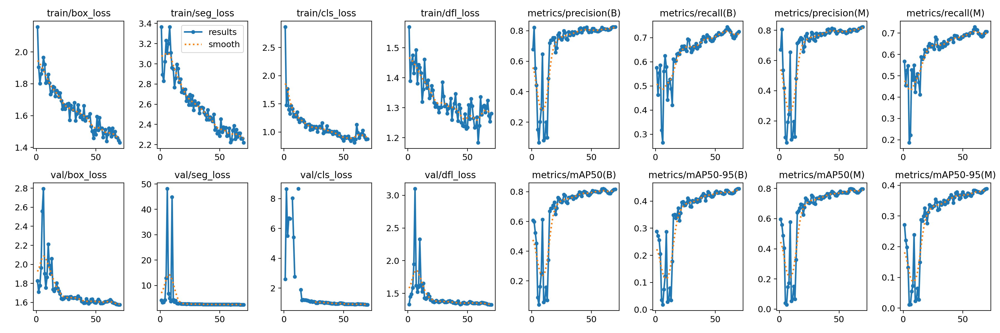

In [ ]:
Image("yolov8_m_dataset_10/results/70_epochs-/results.png")

## Inference

The best model weight after training for `70 epochs` is loaded for inference.

In [ ]:
inference_model = YOLO('yolov8_m_dataset/results/70_epochs-/weights/best.pt')


image 1/1 /content/yolov8_m_dataset/val/images/human_bladder_01.png: 640x640 15 Nucleis, 15.8ms
Speed: 4.5ms preprocess, 15.8ms inference, 7.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict


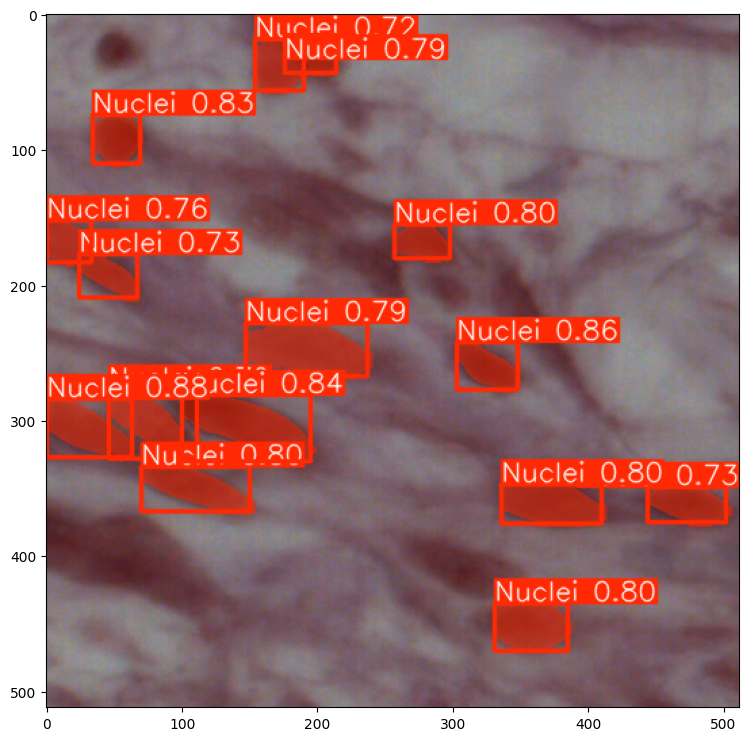

In [ ]:
inference_img_path = "/content/yolov8_m_dataset/val/images/human_bladder_01.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)



image 1/1 /content/yolov8_m_dataset/val/images/human_cerebellum_10.png: 640x640 5 Nucleis, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict


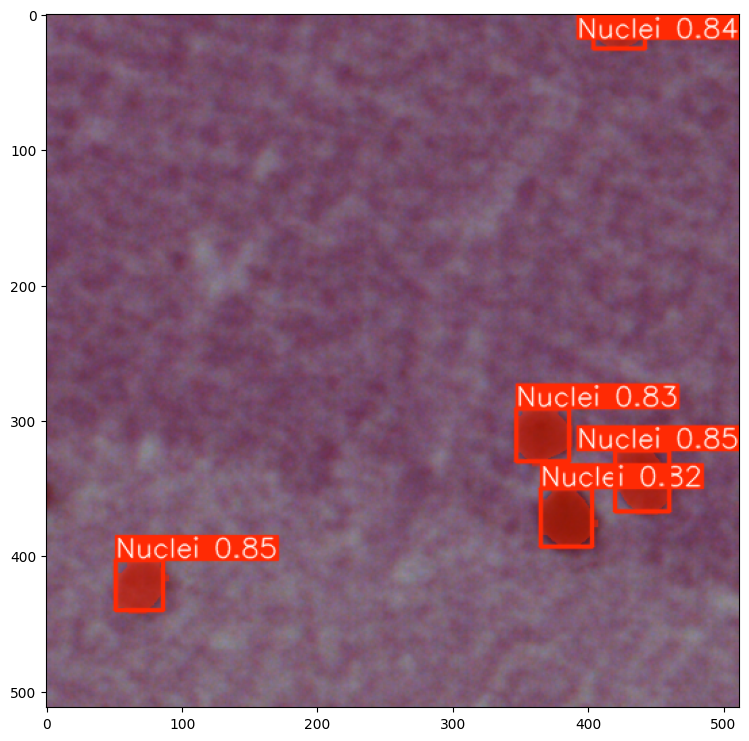

In [ ]:
inference_img_path = "/content/yolov8_m_dataset/val/images/human_cerebellum_10.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_m_dataset/val/images/human_cerebellum_10.png: 640x640 5 Nucleis, 13.6ms
Speed: 3.8ms preprocess, 13.6ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict


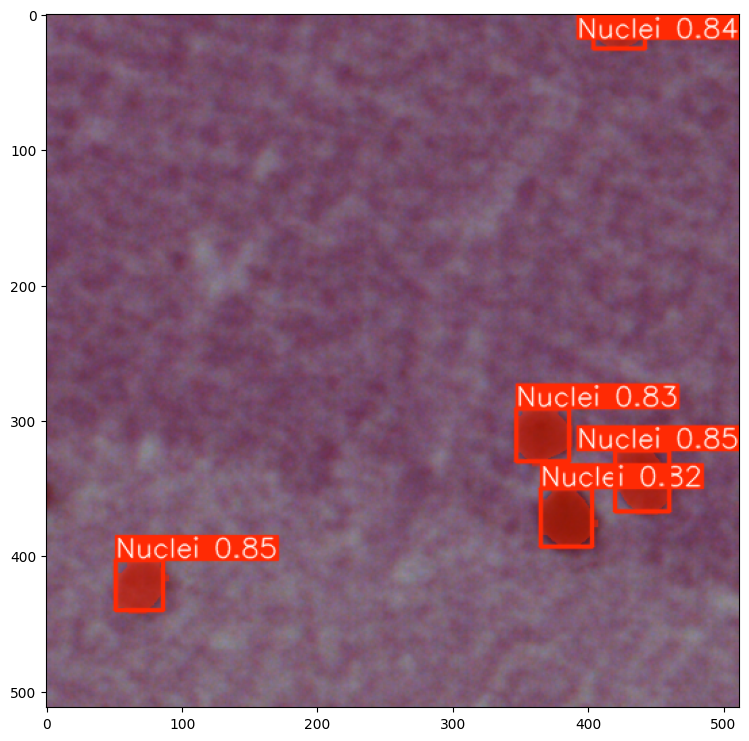

In [ ]:
inference_img_path = "yolov8_m_dataset/val/images/human_epiglottis_4.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_m_dataset/val/images/human_liver_37.png: 640x640 24 Nucleis, 20.4ms
Speed: 4.9ms preprocess, 20.4ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict


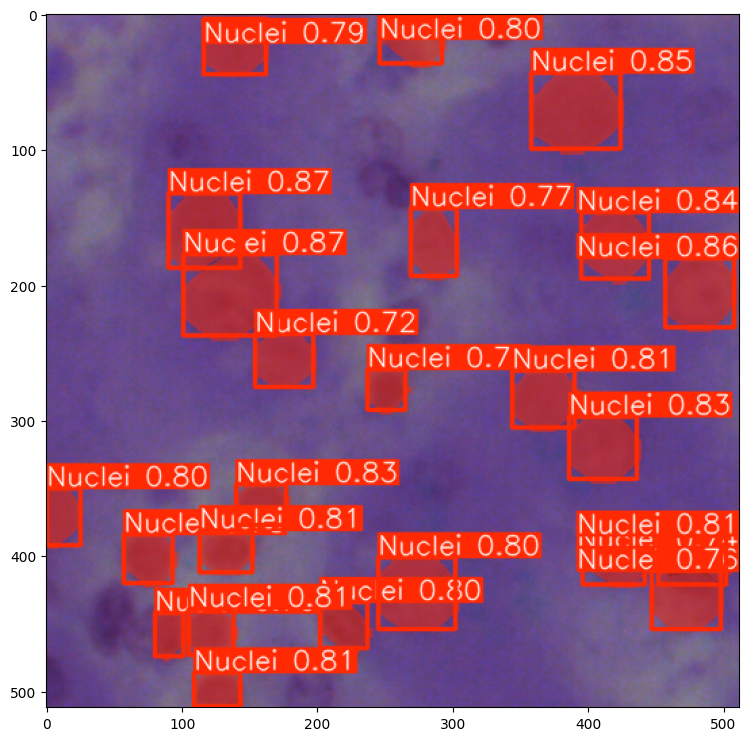

In [ ]:
inference_img_path = "/content/yolov8_m_dataset/val/images/human_liver_37.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_m_dataset/val/images/mouse_kidney_28.png: 640x640 14 Nucleis, 16.4ms
Speed: 3.4ms preprocess, 16.4ms inference, 6.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict


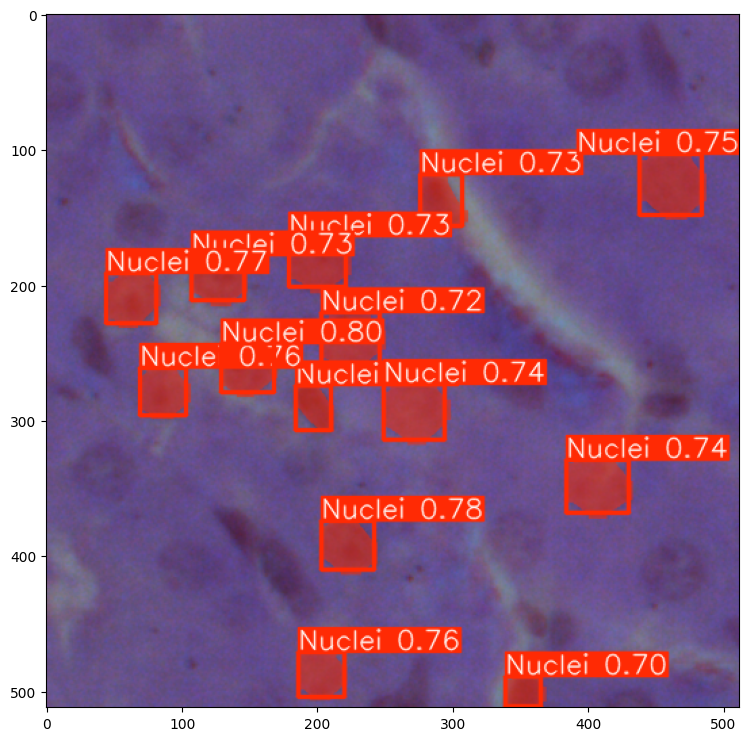

In [ ]:
inference_img_path = "/content/yolov8_m_dataset/val/images/mouse_kidney_28.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /content/yolov8_m_dataset/val/images/mouse_liver_25.png: 640x640 15 Nucleis, 13.4ms
Speed: 3.5ms preprocess, 13.4ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict


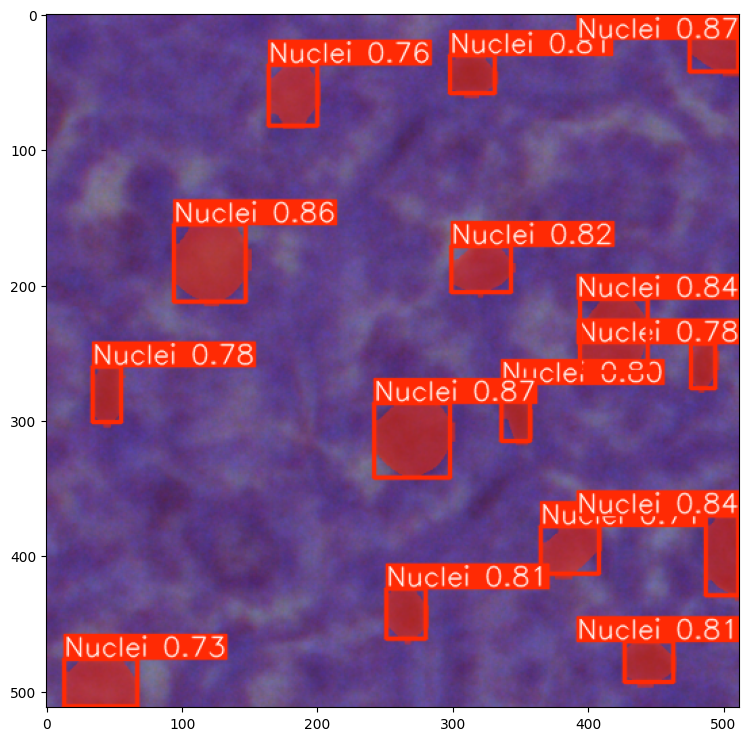

In [ ]:
inference_img_path = "/content/yolov8_m_dataset/val/images/mouse_liver_25.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov8m-640/workspace (1)/orkspace/yolov8_m_dataset/val/images/human_melanoma_03.png: 640x640 14 Nucleis, 82.8ms
Speed: 15.7ms preprocess, 82.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


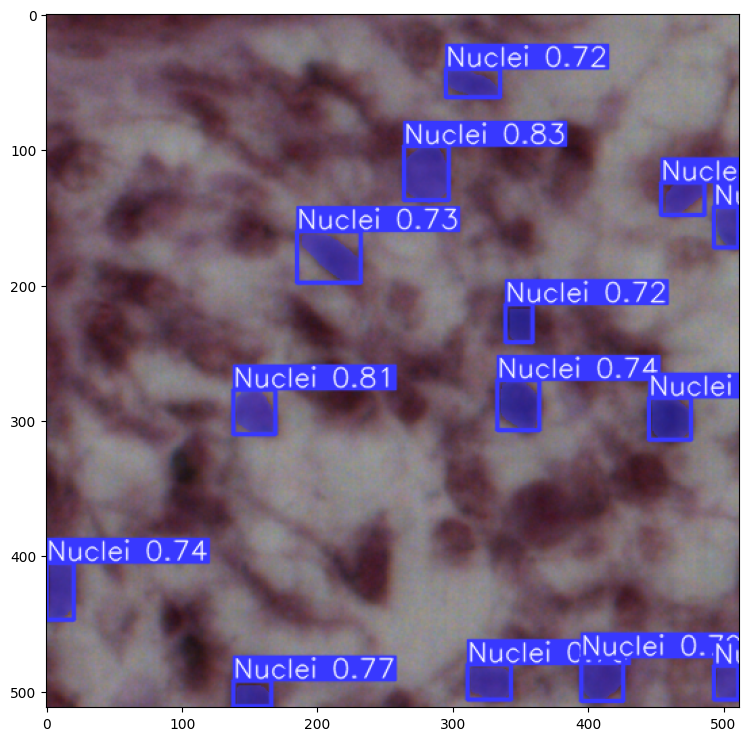

In [ ]:
inference_img_path = "yolov8_m_dataset/val/images/human_melanoma_03.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov8m-640/workspace (1)/orkspace/yolov8_m_dataset/val/images/human_pancreas_11.png: 640x640 33 Nucleis, 82.0ms
Speed: 19.2ms preprocess, 82.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


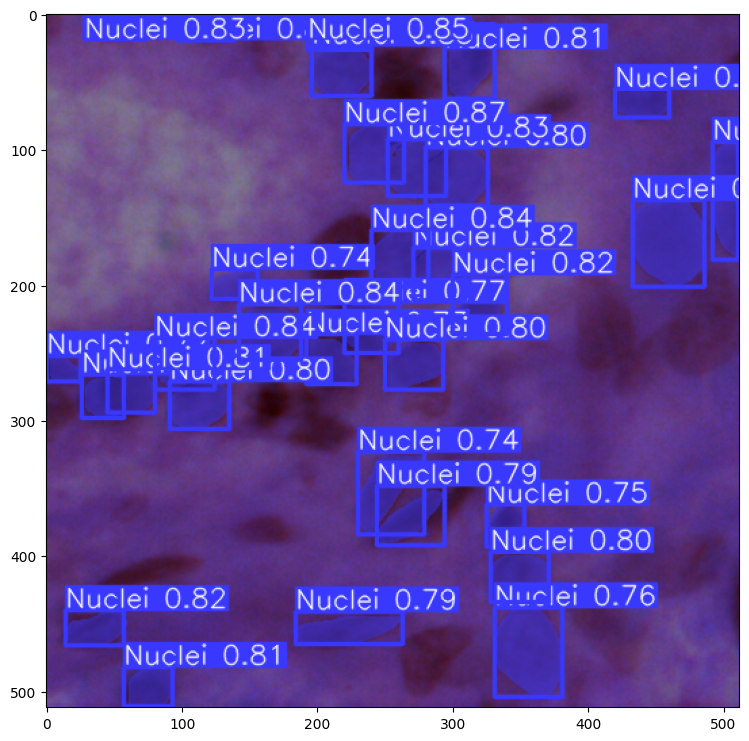

In [ ]:
inference_img_path = "yolov8_m_dataset/val/images/human_pancreas_11.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)


image 1/1 /home/dv/Blog - 1 - Files/Vast/Yolov8m-640/workspace (1)/orkspace/yolov8_m_dataset/val/images/human_peritoneum_3.png: 640x640 16 Nucleis, 72.5ms
Speed: 21.7ms preprocess, 72.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /home/dv/OAK-D/depthai/runs/segment/predict


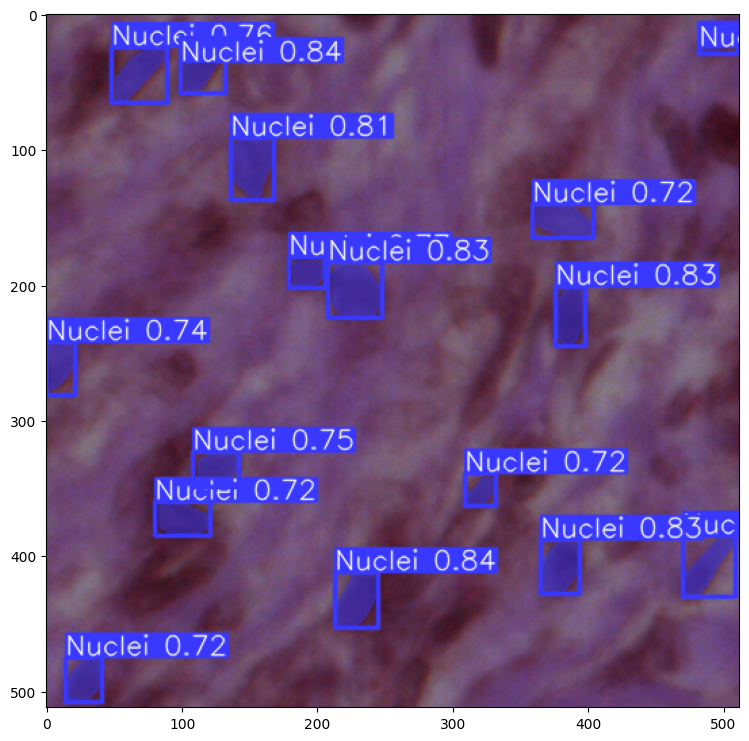

In [ ]:
inference_img_path = "yolov8_m_dataset/val/images/human_peritoneum_3.png"
inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)

inference_result_array = inference_result[0].plot()
plt.figure(figsize=(9,9))
plt.imshow(inference_result_array)

#Save results from 10% data model

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


We save the new model trained with the 10% of the data.

In [ ]:
import shutil

# Define the paths
source_dir = '/content/yolov8_m_dataset_10'
destination_dir = '/content/drive/MyDrive/cancer_cell_detection/Yolov8m_exp_10'

# Copy the directory to Google Drive
shutil.copytree(source_dir, destination_dir)


#Generate data to train the semisupervised model

Label unlabeled data with the model trained with the 10% of the original data. We start by loading the new trained model.

In [ ]:
origin = '/content/drive/MyDrive/cancer_cell_detection/Yolov8m_exp_10'
destination_dir = '/content/Yolov8m_exp_10'
# Copiar la carpeta
!cp -r "$origin" "$destination_dir"
#Load existing model
path = '/content/Yolov8m_exp_10'
inference_model = YOLO(path + '/results/70_epochs-/weights/best.pt')

Use the trained model to predict labels. `stram = True` will create the generator `results` that will help to predict the cell segmentations with memory efficiency.

In [ ]:
#Create a generator for a directory of images
inference_img_path = path + '/unlabeled/images'
results = inference_model(inference_img_path, conf=0.5, stream = True)

count = 0

masks = []
path_img = []
path_none = []
labels_pred = []

# Process results generator
for result in results:
  if result.masks is not None:
    masks.append( result.masks.xyn)  # Normalized masks
    path_img.append(result.path)     #Path of images
    labels_pred.append(result.boxes.cls) #Labels from segmentation
    # Procesar las máscaras aquí
  else:
    count += 1
    path_none.append(result.path) #Images without prediction
    print("No se generaron máscaras para esta predicción.")

print(f"No se generaron máscaras para esta cantidad de predicciones {count}.")


image 1/463 /content/Yolov8m_exp_10/unlabeled/images/human_bladder_01.png: 640x640 15 Nucleis, 12.3ms
image 2/463 /content/Yolov8m_exp_10/unlabeled/images/human_bladder_02.png: 640x640 4 Nucleis, 15.9ms
image 3/463 /content/Yolov8m_exp_10/unlabeled/images/human_bladder_03.png: 640x640 12 Nucleis, 12.2ms
image 4/463 /content/Yolov8m_exp_10/unlabeled/images/human_bladder_05.png: 640x640 17 Nucleis, 11.6ms
image 5/463 /content/Yolov8m_exp_10/unlabeled/images/human_bladder_07.png: 640x640 11 Nucleis, 12.7ms
image 6/463 /content/Yolov8m_exp_10/unlabeled/images/human_bladder_09.png: 640x640 16 Nucleis, 12.2ms
image 7/463 /content/Yolov8m_exp_10/unlabeled/images/human_bladder_11.png: 640x640 26 Nucleis, 11.2ms
image 8/463 /content/Yolov8m_exp_10/unlabeled/images/human_brain_1.png: 640x640 5 Nucleis, 11.2ms
image 9/463 /content/Yolov8m_exp_10/unlabeled/images/human_brain_10.png: 640x640 6 Nucleis, 10.8ms
image 10/463 /content/Yolov8m_exp_10/unlabeled/images/human_brain_11.png: 640x640 5 Nucle

We create functions to extract the polygons from labels and generate annontations saved in .txt files

In [ ]:
def inference_polygons(masks):
  #Recieve: ultralytics.engine.results object (yolo prediction
  # form an image)
  #Returns: a list of polygons form the image

  #Contours save normalized mask points, dimensions (Elements, N points, 2)
  contours = masks
  polygons = []
  for contour in contours:
      poly = contour.reshape(-1).tolist()
      polygons.append(poly)

  return polygons

def save_predictions_to_txt(img_name, labels_pred, polygons, output_path):
    """
    Generates a .txt file with inference predictions for an image.

    :param img_name: Name of the image (without extension)
    :param labels_pred: List of predicted labels
    :param polygons: List of predicted polygons
    :param output_path: Directory where the .txt file will be saved
    """
    output_file = os.path.join(output_path, img_name + '.txt')

    with open(output_file, 'w') as file:
        for label, polygon in zip(labels_pred, polygons):
            # Convert polygon values to formatted strings
            polygon_str = " ".join(map(str, polygon))
            # Write to the file in the format: label polygon
            file.write(f"{int(label)} {polygon_str}\n")


Save new annotations on the `yolov8_m_dataset_ss` directory.

In [ ]:
def copytree(src, dst, symlinks=False, ignore=None):
    for item in os.listdir(src):
        s = os.path.join(src, item)
        d = os.path.join(dst, item)
        if os.path.isdir(s):
            shutil.copytree(s, d, symlinks, ignore)
        else:
            shutil.copy2(s, d)

def create_yaml(output_yaml_path, train_images_dir, val_images_dir, nc=1):
    # Assuming all categories are the same and there is only one class, 'Nuclei'
    names = ['Nuclei']

    # Create a dictionary with the required content
    yaml_data = {
        'names': names,
        'nc': nc,  # Number of classes
        'train': train_images_dir,
        'val': val_images_dir,
        'test': ' '

    }

    # Write the dictionary to a YAML file
    with open(output_yaml_path, 'w') as file:
        yaml.dump(yaml_data, file, default_flow_style=False)

def yolo_dataset_preparation_ss(path_none):
    data_dir = 'Nuclei-Instance-Dataset'
    output_dir = 'yolov8_m_dataset_ss'

    # Define the paths for the images and labels for training and validation
    train_images_dir = os.path.join(output_dir, 'train', 'images')
    train_labels_dir = os.path.join(output_dir, 'train', 'labels')


    # Create the output directories if they do not exist
    os.makedirs(train_images_dir, exist_ok=True)
    os.makedirs(train_labels_dir, exist_ok=True)


    #Copy validation data
    src = "/content/Yolov8m_exp_10/val"
    dst = "/content/yolov8_m_dataset_ss/val"
    shutil.copytree(src, dst, dirs_exist_ok=True)
    #Save labeled images on train dataset
    src = "/content/Yolov8m_exp_10/labeled/images/"
    dst = "/content/yolov8_m_dataset_ss/train/images/"
    copytree(src, dst, symlinks=False, ignore=None)
    #Save unlabeled images on train dataset
    src = "/content/Yolov8m_exp_10/unlabeled/images/"
    dst = "/content/yolov8_m_dataset_ss/train/images/"
    copytree(src, dst, symlinks=False, ignore=None)
    #Save labels from labeled images
    src = "/content/Yolov8m_exp_10/labeled/labels/"
    dst = "/content/yolov8_m_dataset_ss/train/labels/"
    copytree(src, dst, symlinks=False, ignore=None)

    #Delete files not labeled by the model
    names = []
    for path in path_none:
        name = os.path.splitext(os.path.basename(path))[0]
        new_name = f"{name}.png"
        names.append(new_name)

    directory = "/content/yolov8_m_dataset_ss/train/images"

    # Delete files
    for file in os.listdir(directory):
        if file in names:  # Check if the file is in the list
            full_path = os.path.join(directory, file)  # Create the full path
            if os.path.isfile(full_path):  # Check if it's a file
                os.remove(full_path)  # Delete the file
                print(f"Deleted: {full_path}")
            else:
                print(f"Not a valid file: {full_path}")

    # Assume create_yaml function is defined elsewhere and set appropriate paths for the YAML file
    output_yaml_path = os.path.join(output_dir, 'data.yaml')
    train_path = os.path.join('train', 'images')
    val_path = os.path.join('val', 'images')
    create_yaml(output_yaml_path, train_path, val_path)

In [ ]:
yolo_dataset_preparation_ss(path_none)

#Generate polygons
polygons = []
for mask in masks:
  polygons.append(inference_polygons(mask))
#Create txt files with labels and segmentation annotations
#and save them with labels
labeled_images_dir = '/content/yolov8_m_dataset_ss/train/labels'
for idx, img in enumerate(path_img):
  img_name = os.path.splitext(os.path.basename(img))[0]
  save_predictions_to_txt(img_name, labels_pred[idx], polygons[idx], labeled_images_dir)

Deleted: /content/yolov8_m_dataset_ss/train/images/mouse_muscle_tibia_27.png
Deleted: /content/yolov8_m_dataset_ss/train/images/human_umbilical_cord_04.png
Deleted: /content/yolov8_m_dataset_ss/train/images/human_umbilical_cord_07.png
Deleted: /content/yolov8_m_dataset_ss/train/images/mouse_subscapula_01.png


#Train the semisupervised Yolo algorithm

Model configuration

In [ ]:
#Instance
model = YOLO("yolov8m-seg.yaml")#build a model from YAML
model = YOLO("yolov8m-seg.pt") #Transfer the weights from a pretrained model (recommended for training)

In [ ]:
%cat yolov8_m_dataset_ss/data.yaml

names:
- Nuclei
nc: 1
test: ' '
train: train/images
val: val/images


In [ ]:
with open("yolov8_m_dataset_ss/data.yaml",'r') as stream:
     num_classes = str(yaml.safe_load(stream)['nc'])

Trainning

In [ ]:
#Define a project --> Destination directory for all results
project = "yolov8_m_dataset_ss/results"
#Define subdirectory for this specific training
name = "70_epochs-"

ABS_PATH = os.getcwd()

In [ ]:
#Train the model
results = model.train(
    data = os.path.join(ABS_PATH, "yolov8_m_dataset_ss/data.yaml"),
    project = project,
    name = name,
    epochs = 70,
    patience = 0 , #setting patience=0 to disable early stopping,
    batch = 4,
    seed = 42
)

Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=/content/yolov8_m_dataset_ss/data.yaml, epochs=70, time=None, patience=0, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov8_m_dataset_ss/results, name=70_epochs-, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_

100%|██████████| 755k/755k [00:00<00:00, 4.63MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 63.8MB/s]


AMP: checks passed ✅


train: Scanning /content/yolov8_m_dataset_ss/train/labels... 528 images, 0 backgrounds, 0 corrupt: 100%|██████████| 528/528 [00:02<00:00, 225.49it/s]


train: New cache created: /content/yolov8_m_dataset_ss/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/yolov8_m_dataset_ss/val/labels... 133 images, 0 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<00:00, 201.68it/s]


val: New cache created: /content/yolov8_m_dataset_ss/val/labels.cache
Plotting labels to yolov8_m_dataset_ss/results/70_epochs-/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 86 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to yolov8_m_dataset_ss/results/70_epochs-
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/70      4.46G      1.381      2.158      1.274      1.189         94        640: 100%|██████████| 132/132 [00:36<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:02<00:00,  8.22it/s]


                   all        133       5575      0.686      0.636       0.68      0.332      0.675      0.608      0.655      0.279

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/70      4.25G      1.212      1.861     0.8931      1.117        177        640: 100%|██████████| 132/132 [00:33<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:02<00:00,  8.35it/s]

                   all        133       5575      0.758      0.686      0.754       0.37       0.75      0.677      0.743      0.345



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/70       5.1G      1.229      1.868     0.9307       1.11        277        640: 100%|██████████| 132/132 [00:32<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.62it/s]

                   all        133       5575      0.757      0.622      0.717      0.363      0.748      0.606      0.691      0.313



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/70       5.2G      1.267      1.937     0.8868      1.133        159        640: 100%|██████████| 132/132 [00:32<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.28it/s]

                   all        133       5575      0.734      0.625      0.676      0.302      0.736      0.616      0.671      0.293



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/70      5.33G       1.21      1.778     0.8778      1.122        172        640: 100%|██████████| 132/132 [00:31<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.29it/s]

                   all        133       5575      0.779       0.67       0.76      0.386      0.774      0.661      0.746       0.35



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/70      4.77G      1.201      1.714     0.8754       1.11        167        640: 100%|██████████| 132/132 [00:31<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  8.93it/s]


                   all        133       5575      0.764      0.649      0.722      0.337       0.76      0.645      0.717      0.322

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/70      5.48G      1.176      1.666     0.7896      1.096        179        640: 100%|██████████| 132/132 [00:30<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  8.91it/s]

                   all        133       5575      0.802      0.688      0.785        0.4        0.8      0.676      0.772      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/70      6.94G      1.142      1.661     0.7416      1.081        208        640: 100%|██████████| 132/132 [00:32<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.00it/s]

                   all        133       5575      0.797      0.684      0.778        0.4      0.794       0.67      0.763      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/70      6.52G      1.143      1.632      0.763      1.076        298        640: 100%|██████████| 132/132 [00:32<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.38it/s]

                   all        133       5575      0.786      0.691      0.768      0.375      0.774      0.676      0.748      0.334



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/70      5.89G      1.156       1.66     0.7811       1.09        112        640: 100%|██████████| 132/132 [00:32<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  8.87it/s]


                   all        133       5575      0.768        0.7      0.769      0.377       0.76       0.69      0.755      0.348

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/70      6.31G      1.123      1.554     0.7603      1.075        161        640: 100%|██████████| 132/132 [00:31<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.96it/s]

                   all        133       5575      0.795      0.685      0.774      0.389      0.788      0.677       0.76      0.347



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/70      5.35G      1.119        1.6     0.7152      1.073        391        640: 100%|██████████| 132/132 [00:31<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.76it/s]

                   all        133       5575      0.799      0.705      0.785      0.377      0.791      0.697      0.776      0.355



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/70      4.88G      1.117      1.575     0.7349      1.079        161        640: 100%|██████████| 132/132 [00:31<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.73it/s]

                   all        133       5575      0.773      0.664       0.75      0.367      0.761      0.647      0.729      0.332



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/70      7.86G      1.088      1.572     0.7044      1.063        340        640: 100%|██████████| 132/132 [00:32<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.25it/s]


                   all        133       5575      0.782      0.696      0.765      0.352      0.778      0.686      0.757      0.336

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/70      4.51G      1.083      1.526     0.6868      1.057        158        640: 100%|██████████| 132/132 [00:32<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.03it/s]

                   all        133       5575      0.803      0.698      0.786        0.4      0.797      0.688      0.774      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/70      4.17G      1.065      1.521     0.6762      1.051        120        640: 100%|██████████| 132/132 [00:31<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.43it/s]

                   all        133       5575      0.801      0.704      0.785      0.396      0.793      0.688      0.769      0.353



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/70      6.66G      1.061      1.509     0.6849      1.043        195        640: 100%|██████████| 132/132 [00:31<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.23it/s]

                   all        133       5575      0.784      0.717      0.777       0.38       0.79      0.695      0.767      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/70      5.82G      1.074      1.501     0.6779      1.059        132        640: 100%|██████████| 132/132 [00:32<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.32it/s]

                   all        133       5575      0.818      0.701      0.797      0.396      0.807      0.688      0.779      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/70      7.05G      1.066      1.478      0.697      1.042        163        640: 100%|██████████| 132/132 [00:31<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.53it/s]

                   all        133       5575      0.806      0.708      0.789      0.388      0.802      0.698       0.78      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/70      7.07G      1.074       1.48     0.6679      1.049        131        640: 100%|██████████| 132/132 [00:32<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  8.97it/s]

                   all        133       5575      0.798       0.72      0.789      0.401      0.807      0.694      0.778      0.363



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/70      5.58G      1.039      1.442     0.6576      1.036         79        640: 100%|██████████| 132/132 [00:31<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.01it/s]

                   all        133       5575       0.81        0.7      0.801       0.41      0.821      0.679      0.787      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/70      6.08G      1.065       1.51     0.6527      1.049        123        640: 100%|██████████| 132/132 [00:31<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.41it/s]

                   all        133       5575      0.818      0.698      0.794      0.403      0.813      0.686      0.783      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/70      6.42G      1.071      1.469      0.661      1.039        159        640: 100%|██████████| 132/132 [00:31<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.54it/s]

                   all        133       5575      0.804       0.71      0.792        0.4      0.793      0.701      0.779      0.364



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/70       5.3G      1.042      1.428     0.6482      1.033        197        640: 100%|██████████| 132/132 [00:31<00:00,  4.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.93it/s]

                   all        133       5575      0.788      0.698      0.773      0.379       0.79      0.683      0.763      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/70      5.03G      1.055      1.447     0.6364      1.042         74        640: 100%|██████████| 132/132 [00:31<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.09it/s]


                   all        133       5575      0.806      0.708      0.792      0.396      0.807       0.69      0.777       0.36

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/70      7.13G      1.043      1.476     0.6371      1.043        120        640: 100%|██████████| 132/132 [00:32<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  8.88it/s]

                   all        133       5575      0.817      0.684      0.787      0.409      0.808       0.67      0.772      0.362



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/70      6.13G       1.03      1.441     0.6294      1.044         61        640: 100%|██████████| 132/132 [00:31<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.98it/s]


                   all        133       5575      0.816      0.713      0.803      0.408      0.812      0.696      0.788      0.364

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/70      5.35G       1.02       1.39     0.6101      1.021        164        640: 100%|██████████| 132/132 [00:31<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.65it/s]

                   all        133       5575      0.823      0.709      0.802      0.409      0.818      0.696      0.792       0.38



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/70      6.08G      1.039      1.434     0.6314      1.033        162        640: 100%|██████████| 132/132 [00:31<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  8.98it/s]

                   all        133       5575      0.814      0.724      0.809      0.415      0.809      0.709      0.794      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/70      6.92G      1.025        1.4     0.6153      1.037        173        640: 100%|██████████| 132/132 [00:31<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.35it/s]

                   all        133       5575      0.827      0.713      0.803      0.402      0.818      0.698      0.787      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/70      6.04G      1.044       1.45     0.6225      1.037        365        640: 100%|██████████| 132/132 [00:31<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.68it/s]

                   all        133       5575      0.816      0.712      0.803      0.399      0.811      0.704      0.796      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/70      5.96G      1.013      1.378     0.6137       1.03        168        640: 100%|██████████| 132/132 [00:31<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.18it/s]


                   all        133       5575      0.819      0.695      0.792      0.393      0.815      0.685      0.787      0.372

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/70      6.52G      1.003      1.373     0.6019      1.019         91        640: 100%|██████████| 132/132 [00:31<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.48it/s]

                   all        133       5575      0.808      0.694      0.786      0.388      0.802      0.685      0.775      0.361



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/70      5.75G      1.016      1.384     0.6038      1.013        111        640: 100%|██████████| 132/132 [00:33<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.30it/s]

                   all        133       5575      0.807      0.725      0.799      0.393      0.804      0.709      0.788      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/70      5.44G      1.011       1.37     0.6036      1.024        339        640: 100%|██████████| 132/132 [00:31<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.10it/s]


                   all        133       5575      0.808      0.712      0.793      0.385      0.803      0.706      0.791      0.364

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/70      4.72G       1.02      1.376     0.6095      1.023        213        640: 100%|██████████| 132/132 [00:32<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:02<00:00,  7.98it/s]

                   all        133       5575      0.818      0.721      0.802      0.399       0.81       0.71      0.788      0.365



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/70      5.77G     0.9859      1.353     0.5865      1.013         86        640: 100%|██████████| 132/132 [00:31<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.73it/s]

                   all        133       5575       0.82      0.715      0.802      0.408      0.811      0.697      0.787       0.37



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/70      5.18G      1.002      1.355     0.5885      1.018        227        640: 100%|██████████| 132/132 [00:31<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.69it/s]


                   all        133       5575      0.815      0.696      0.792      0.404      0.804      0.685      0.779      0.366

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/70      5.35G      0.995      1.346     0.5894      1.012        135        640: 100%|██████████| 132/132 [00:32<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.30it/s]

                   all        133       5575      0.819      0.715      0.806      0.415      0.817      0.712        0.8      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/70      5.79G     0.9851       1.33     0.5789      1.018        102        640: 100%|██████████| 132/132 [00:32<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.52it/s]


                   all        133       5575      0.809      0.702      0.797      0.398      0.809      0.689      0.787      0.367

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/70      6.75G     0.9989      1.339      0.578      1.018        118        640: 100%|██████████| 132/132 [00:32<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  8.81it/s]


                   all        133       5575      0.822      0.712       0.81      0.415       0.82      0.695      0.795      0.371

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/70      6.84G     0.9863      1.347     0.5631      1.006         73        640: 100%|██████████| 132/132 [00:33<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.28it/s]

                   all        133       5575      0.807      0.723      0.793      0.388      0.802      0.707      0.784      0.359



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/70       5.6G     0.9991      1.334      0.575      1.024        205        640: 100%|██████████| 132/132 [00:32<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.14it/s]

                   all        133       5575      0.812      0.716        0.8      0.402      0.809      0.702       0.79      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/70      6.57G     0.9705      1.295      0.567      1.005        183        640: 100%|██████████| 132/132 [00:31<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.42it/s]

                   all        133       5575      0.842      0.702      0.809      0.422      0.832      0.686      0.793      0.385



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/70      6.11G     0.9793      1.313     0.5681      1.012        391        640: 100%|██████████| 132/132 [00:31<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.20it/s]

                   all        133       5575      0.821      0.723      0.812      0.414      0.815      0.711      0.798      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/70      6.56G      0.965      1.287     0.5529     0.9961        226        640: 100%|██████████| 132/132 [00:32<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.11it/s]

                   all        133       5575      0.822      0.713      0.808       0.41      0.807      0.696       0.79      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/70      5.81G     0.9749      1.296      0.553      1.005         58        640: 100%|██████████| 132/132 [00:31<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.69it/s]

                   all        133       5575      0.827      0.708      0.804      0.408      0.813      0.694      0.787      0.369



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/70      5.47G      0.974      1.292     0.5551      1.019        163        640: 100%|██████████| 132/132 [00:31<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.29it/s]


                   all        133       5575      0.832      0.717      0.812      0.417      0.819      0.702      0.794      0.374

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/70      6.96G     0.9837      1.315     0.5587       1.01         63        640: 100%|██████████| 132/132 [00:31<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.17it/s]

                   all        133       5575       0.83      0.702      0.803      0.416      0.824       0.69      0.793       0.38



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/70      5.71G     0.9418      1.235      0.543      1.002        189        640: 100%|██████████| 132/132 [00:32<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.97it/s]

                   all        133       5575      0.826      0.708      0.804      0.414      0.821      0.691      0.791      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/70      4.23G     0.9862      1.323      0.566      1.013        141        640: 100%|██████████| 132/132 [00:33<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.52it/s]

                   all        133       5575      0.823      0.709      0.797      0.408      0.817      0.696      0.787      0.371



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/70      6.76G     0.9579      1.268     0.5458     0.9977        101        640: 100%|██████████| 132/132 [00:31<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:02<00:00,  8.42it/s]


                   all        133       5575      0.819      0.725      0.805      0.404      0.812      0.714      0.795      0.379

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/70      4.15G     0.9683      1.268     0.5396     0.9991         86        640: 100%|██████████| 132/132 [00:32<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.13it/s]


                   all        133       5575      0.823      0.714      0.806      0.411      0.819      0.702      0.796      0.375

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/70      4.99G     0.9867      1.302     0.5619      1.005        218        640: 100%|██████████| 132/132 [00:31<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.89it/s]

                   all        133       5575      0.828      0.727      0.812      0.408       0.82      0.717      0.802      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/70      4.57G     0.9441      1.251     0.5389      0.997         92        640: 100%|██████████| 132/132 [00:31<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00, 10.05it/s]

                   all        133       5575      0.826      0.723      0.809      0.408      0.816      0.711      0.796      0.375



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/70      7.33G     0.9586      1.251     0.5356     0.9913         71        640: 100%|██████████| 132/132 [00:31<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.35it/s]

                   all        133       5575      0.829        0.7      0.778      0.388       0.82       0.69      0.768       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      57/70      5.43G     0.9366      1.214     0.5309     0.9898        328        640: 100%|██████████| 132/132 [00:31<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.65it/s]

                   all        133       5575      0.824      0.707      0.804      0.399       0.82      0.696      0.792      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      58/70      5.91G     0.9525      1.249     0.5265     0.9967        193        640: 100%|██████████| 132/132 [00:32<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:02<00:00,  8.37it/s]

                   all        133       5575      0.819      0.715      0.801      0.399      0.809      0.701      0.787      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      59/70      5.15G     0.9573       1.24     0.5223     0.9941        161        640: 100%|██████████| 132/132 [00:31<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.72it/s]

                   all        133       5575      0.825      0.722      0.814      0.417      0.818      0.706      0.798      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      60/70      4.79G     0.9242      1.193     0.5132     0.9813        257        640: 100%|██████████| 132/132 [00:33<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  8.87it/s]

                   all        133       5575      0.838      0.709      0.808      0.417      0.825      0.693      0.793      0.378


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      61/70      4.83G     0.9366      1.235     0.5404      1.014         88        640: 100%|██████████| 132/132 [00:24<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00, 10.24it/s]

                   all        133       5575      0.829       0.73       0.81      0.403      0.816      0.717      0.794      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      62/70       5.3G     0.9373      1.198     0.5231      1.026         86        640: 100%|██████████| 132/132 [00:23<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.42it/s]

                   all        133       5575      0.821       0.72      0.805      0.404      0.814      0.706       0.79      0.372



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      63/70      4.36G     0.9161      1.176     0.5215      1.006        115        640: 100%|██████████| 132/132 [00:22<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00, 10.13it/s]

                   all        133       5575      0.833      0.714      0.811      0.415      0.821      0.695      0.792      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      64/70      4.84G     0.9341      1.212     0.5171      1.018        129        640: 100%|██████████| 132/132 [00:22<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00, 10.21it/s]


                   all        133       5575       0.83      0.708      0.806      0.414      0.822      0.697      0.793      0.379

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      65/70      4.18G     0.9223      1.189     0.5107      1.012        138        640: 100%|██████████| 132/132 [00:22<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00, 10.66it/s]

                   all        133       5575      0.843      0.708      0.807      0.412      0.831      0.694      0.794      0.377



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      66/70      5.61G     0.9076      1.153     0.4929      1.002         56        640: 100%|██████████| 132/132 [00:22<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.70it/s]


                   all        133       5575      0.834      0.709      0.808      0.416      0.825      0.696      0.795      0.383

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      67/70      4.17G      0.906      1.164     0.4909     0.9979         57        640: 100%|██████████| 132/132 [00:23<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.93it/s]

                   all        133       5575      0.832      0.705      0.807      0.415      0.825      0.693      0.793      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      68/70      5.42G     0.9049      1.157     0.4913     0.9985        238        640: 100%|██████████| 132/132 [00:22<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00, 10.13it/s]

                   all        133       5575      0.835       0.71      0.811      0.414      0.829      0.693      0.796      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      69/70      4.78G     0.9023      1.167     0.4927      1.007         79        640: 100%|██████████| 132/132 [00:22<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.79it/s]

                   all        133       5575       0.83      0.716      0.811      0.414      0.825      0.698      0.796      0.378



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      70/70      4.66G     0.8989      1.159     0.4881      1.002         71        640: 100%|██████████| 132/132 [00:23<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:01<00:00,  9.53it/s]

                   all        133       5575      0.837      0.708      0.812      0.417       0.83      0.691      0.797      0.383



70 epochs completed in 0.659 hours.
Optimizer stripped from yolov8_m_dataset_ss/results/70_epochs-/weights/last.pt, 54.8MB
Optimizer stripped from yolov8_m_dataset_ss/results/70_epochs-/weights/best.pt, 54.8MB

Validating yolov8_m_dataset_ss/results/70_epochs-/weights/best.pt...
Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLOv8m-seg summary (fused): 245 layers, 27,222,963 parameters, 0 gradients, 110.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 17/17 [00:03<00:00,  4.80it/s]


                   all        133       5575      0.843      0.703      0.809      0.422      0.833      0.685      0.793      0.385
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to yolov8_m_dataset_ss/results/70_epochs-


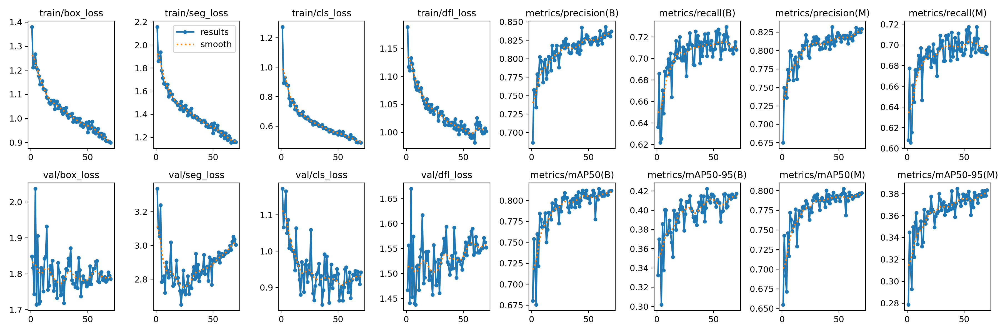

In [ ]:
Image("yolov8_m_dataset_ss/results/70_epochs-/results.png")

#Inference results

In [ ]:
inference_model_1 = YOLO('/content/Yolov8m_exp_10/results/70_epochs-/weights/best.pt')
inference_model_2 = YOLO('/content/yolov8_m_dataset_ss/results/70_epochs-/weights/best.pt')
inference_model_3 = YOLO('/content/drive/MyDrive/cancer_cell_detection/Yolov8m_exp/results/70_epochs-/weights/best.pt')


image 1/1 /content/drive/MyDrive/cancer_cell_detection/Yolov8m_exp/val/images/human_bladder_10.png: 640x640 10 Nucleis, 11.6ms
Speed: 2.7ms preprocess, 11.6ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict3

image 1/1 /content/drive/MyDrive/cancer_cell_detection/Yolov8m_exp/val/images/human_bladder_10.png: 640x640 13 Nucleis, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict4

image 1/1 /content/drive/MyDrive/cancer_cell_detection/Yolov8m_exp/val/images/human_bladder_10.png: 640x640 18 Nucleis, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict5


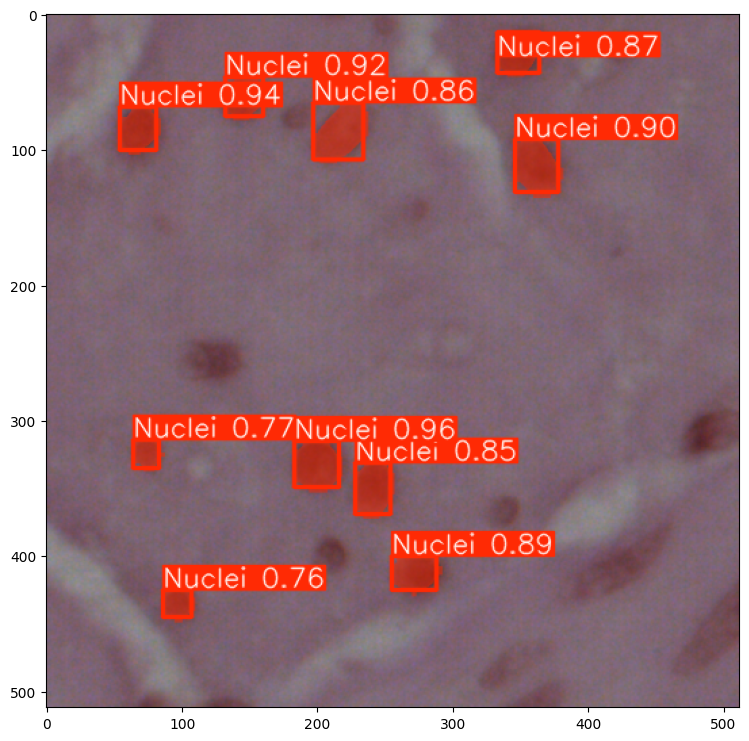

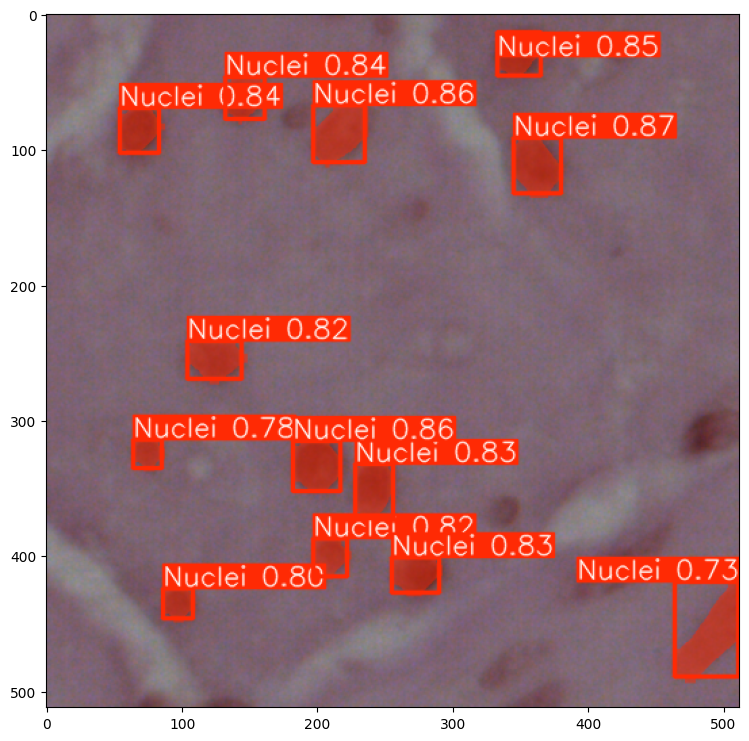

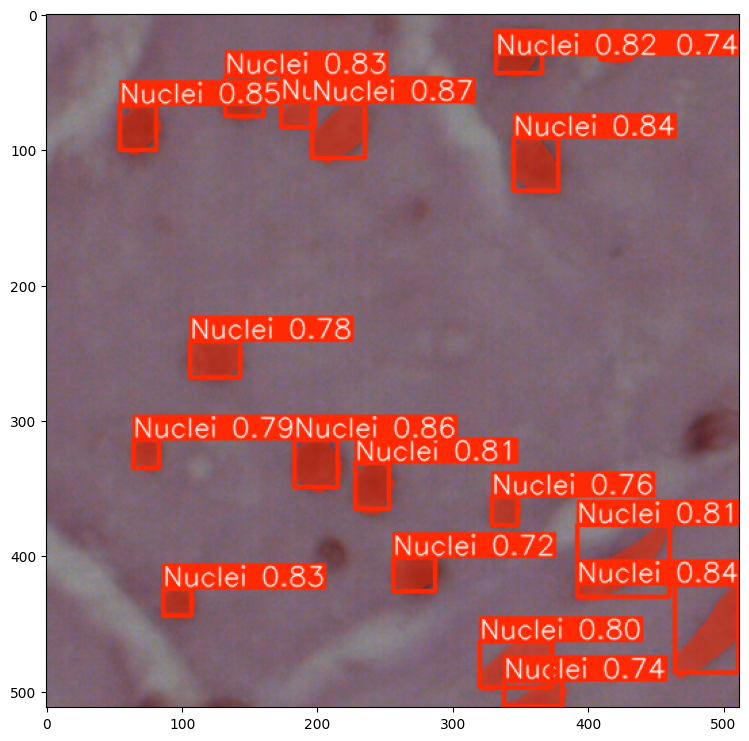

In [ ]:

def plot_inference(inference_model, inference_img_path):
  inference_result = inference_model.predict(inference_img_path,conf=0.7,save=True)
  inference_result_array = inference_result[0].plot()
  plt.figure(figsize=(9,9))
  plt.imshow(inference_result_array)

inference_img_path = "/content/drive/MyDrive/cancer_cell_detection/Yolov8m_exp/val/images/human_bladder_10.png"
plot_inference(inference_model_1, inference_img_path)
plot_inference(inference_model_2, inference_img_path)
plot_inference(inference_model_3, inference_img_path)

In [ ]:
import shutil

# Define the paths
source_dir = '/content/yolov8_m_dataset_ss'
destination_dir = '/content/drive/MyDrive/cancer_cell_detection/Yolov8m_exp_ss'

# Copy the directory to Google Drive
shutil.copytree(source_dir, destination_dir)


'/content/drive/MyDrive/cancer_cell_detection/Yolov8m_exp_ss'